<h1>Eight-bit Histograms on Jupyter</h1>

<img src="https://reconstrue.github.io/shell/ui/eight_bit_dual_gauge.png" />

# Introduction
The topic of this notebook is plotting 8-bit histograms in Jupyter. There a tons of implementations herein. Most of the are meh, background characters in the story; those chucks of Python resulted from tangoing with various plotting package's APIs. The more well-crafted ones are moving into a `pip install`able package for easy use in other projects (see [Issue #54](https://github.com/reconstrue/shell/issues/54)).



**TODO:** In the end, this whole notebook should simply be a demo of a Python package, eight_bit_guages. Just kill of the meh implemenations, or farm them out to an also_rans.

8-bit just means the integers ranging from 0 to 255. Two to the eighth power is 256, but we want a zero in there so the eight bits are used to encode the range 0 to 255 (a.k.a `0b00000000` to `0b11111111`). To reflect the underlying raw data these gauges do not display 1 to 256.

In photography, the web, and microscopy image data is often encoded in 8-bits. Of course, higher quality is often used as well – for example, 16-bit and [32-bit](https://www.premiumbeat.com/blog/8-bit-color-vs-32-bit-color-in-video-color-grading/). But for microscopy (grayscale) and RGB color on the web, 8-bit is the natural data format, or in more precisely Python terms: uint8. This notebook focuses on the 8-bit world.

Histograms are very useful for comprehending such things as [[*](https://towardsdatascience.com/histograms-in-image-processing-with-skimage-python-be5938962935)]:
>- Exposure
- Contrast
- Dynamic Range
- Saturation

There are tons of ways to generate histograms in Python. The goal here is to see which packages can be dialed in for representing 8-bit histograms.  The "challenging" part of this little R&D task was the 256 bars, whereas most charting packages seemingly assume many fewer bars, say, at most fifty; higher counts get treated more like a smoothed line plot. Many popular packages are not optimized for generating a respectable looking dual histogram of 256 bins/bars.


## Binning performance

The original use for this library was in plotting intensity distribution of the pixels in a image. As such there are convenience methods to pass a grayscale image (a 2D array) rather than the simpler methods which assume the pixel intensities have been pre-binned by the code using this library.

So, this library will in some cases be performing binning internally (when passed a grayscale 8-bit image). There are multiple ways to bin the values, so performance test were conducted, see [pixel_binning_speed_test.ipynb](https://colab.research.google.com/drive/1Usq-YXN53O31JmpnLH-kH7TVZxdMrOym#scrollTo=GFwvPeDiap-j).

## Imports and constants

In [0]:
#@markdown All imports

# Bokeh:
import bokeh.io
from bokeh.models import ColumnDataSource, Step
from bokeh.models import LinearAxis, Range1d
import bokeh.plotting

# Skimage:
import skimage
import skimage.color
import skimage.exposure
import skimage.io

# Miscellaneous
from google.colab.data_table import DataTable
import ipywidgets
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import requests

In [0]:
#@markdown Some constants
# Styling constants
dark_navy = '#0b559f'
dark_red = '#a00000'
mid_gray = '#909090'
light_gray = '#b0b0b0'

eight_bit_range = np.arange(0, 256, 1)

## Sample data to plot

Off the web, let's pull in some image to the Colab VM file system.

In [0]:
#@markdown Download a sample image

# TODO: cull or just find more interesting demo
def download_sample_data():
  # This purple_noise*.jpg image has a bit of purple in it:
  #purple_noise_url = 'https://johntigue.github.io/whiteboarder/demo/red_kneecap.input.jpg'
  cache_path = '/content/' # default home dir on Colab

  #https://github.com/reconstrue/shell/blob/master/ui/eight_bit_dual_gauge.png
  an_example_url = 'https://reconstrue.github.io/brightfield/content/images/651748297.minip_colored_turbo.tif.cropped.png'

  #an_example_url = 'https://johntigue.github.io/whiteboarder/demo/red_kneecap.input.jpg'
  downloaded_file_name = cache_path + 'downloaded.jpg'

  response = requests.get(an_example_url)
  with open(downloaded_file_name, 'wb') as f:
    f.write(response.content)

  !ls -lh {downloaded_file_name}
  return downloaded_file_name

# This works; interesting histogram but lame demo – too unbalances. Was replace with skimage.data.chelsea()
# in_file_name = download_sample_data()

The way to convert a color image to a grayscale one is to use some utility convertor such as `skimage.color.rgb2gray()`.

The naive way that is probably not the desired conversion would be to simply:
```
color_image = skimage.io.imread(in_file_name)
grayed_image = color_image[:,:,0] + color_image[:,:,1] + color_image[:,:,2]
```
The latter is technically ok but probably not what we want. Things like `rgb2gray()` weight the 3 color channel in a perceptually accurate fashion.


,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

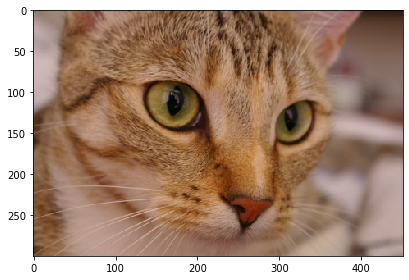

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

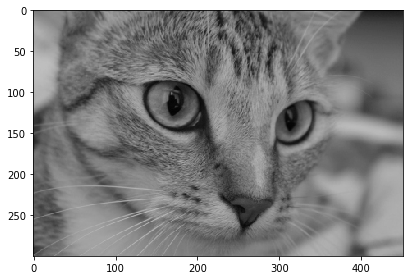

<IPython.core.display.Javascript object>

In [0]:
#@markdown Sample image and grayscaled

# color_image = skimage.io.imread(in_file_name)
color_image = skimage.data.chelsea()
grayed_image = skimage.color.rgb2gray(color_image)

grid = google.colab.widgets.Grid(1, 2, style='border:none') 
# Input image:
with grid.output_to(0, 0):
  _ = skimage.io.imshow(color_image)

with grid.output_to(0,1):
  _ = skimage.io.imshow(grayed_image)

In [0]:
%time

intensities_histed, bins_out = skimage.exposure.histogram(grayed_image, 256)
intensities_cdf, bins = skimage.exposure.cumulative_distribution(grayed_image, 156)


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 6.68 µs


# Matplotlib

[Matplotlib can produce histogram](https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.pyplot.hist.html) easily enough. Here's a sample plot

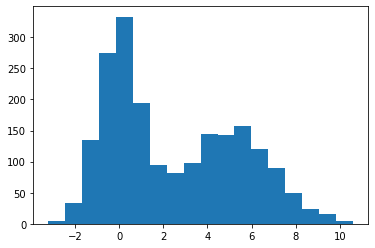

In [0]:
#@markdown Super basic `matplotlib`

def generate_random_dist():
  mu, sigma = 0, 0.5

  measurements_to_simulate = 2000
  measured = np.random.normal(mu, sigma, measurements_to_simulate)
  hist, edges = np.histogram(measured, density=True, bins=256)

  rng = np.random.RandomState(10)  # deterministic random data
  a = np.hstack((rng.normal(size=1000),
                 rng.normal(loc=5, scale=2, size=1000)))
  return a

sample_dist = generate_random_dist() 
_ = plt.hist(sample_dist, bins='auto')

That's about 20 bars. But if the goal is to have 256 bars (one per bucket), the above code does not mindlessly scale to 8-bit range:


## Effect of auto-binning 

In this next juxtaposition, the only difference is the value of `bin`: 256 or auto.

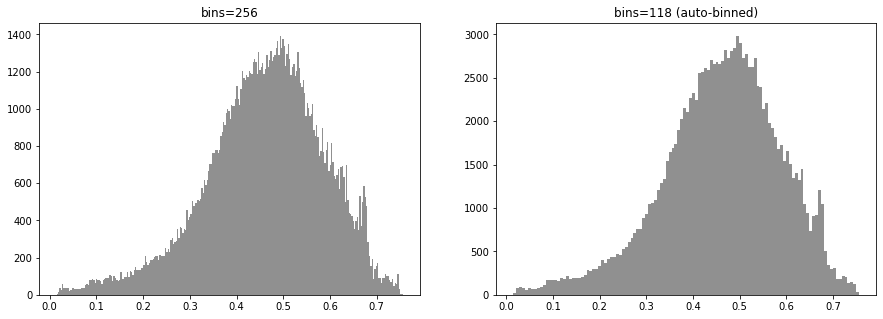

In [0]:
#@markdown Don't use `autobin`, want 256 bins
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))

intensities, _, _ = ax1.hist(grayed_image.ravel(), bins = 256, color=mid_gray) # , range=(0,255)) # lw=0, ec='none', edgecolor='none')
_ = ax1.set_title(f'bins={len(intensities)}')

intensities_auto_binned, _, _ = ax2.hist(grayed_image.ravel(), bins='auto', color=mid_gray) # This makes thousands of buckets, range=(0, 255))
#print(f'Number of bins created = {len(intensities)}')
_ = ax2.set_title(f'bins={len(intensities_auto_binned)} (auto-binned)')


So `bins='auto'` is not helpful in this 8-bit range world: we want exactly 256 bins. In other contexts auto-binning is quite handy, just not here. 

Depending on the number of bins auto generated, there may also be unfortunate plotting artifacts – the thin white lines in the blue plot area. But that's fixed easy enough: turn off the `edgecolor`.


256
(256,)
2417.0


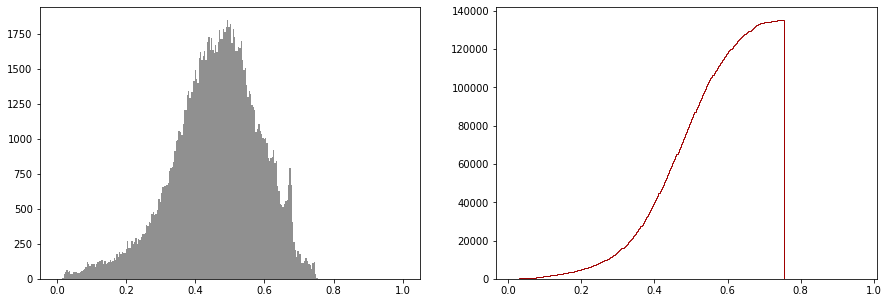

In [0]:
#@markdown Grayscaled Intensities, binned by Matplotlib hist()
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))

intensities_by_mpl_hist, _, _ = ax1.hist(grayed_image.ravel(),256,[0,1], histtype='bar', color=mid_gray)
#_ = ax1.set_title("Grayscaled Intensities, binned by Matplotlib hist()")

intensities_cumulative, bin_edges, _ = ax2.hist(grayed_image.ravel(), bins=256, cumulative=True, histtype='step', color=dark_red) #,  range=(0,255)) # lw=0, ec='none', edgecolor='none')

# white out that stupid line on the right
ax2.axvline(x=0.96, ymin = 0, ymax=1000000, color = 'white', linewidth = 7)

print(len(intensities_cumulative))
print(intensities_cumulative.shape)
print(intensities_cumulative[42])

Examples of badness:
- https://www.datacamp.com/community/tutorials/histograms-matplotlib
- [Image enhancement by Histogram equalization](https://www.researchgate.net/publication/283727396_Image_enhancement_by_Histogram_equalization), September 2015


## Intensities dual gauge

Matplotlib has a built-in `hist(…cumulative=False,…)` which can calculate the intensities distribution and cumulative distribution, and as a side effect generate a plot.

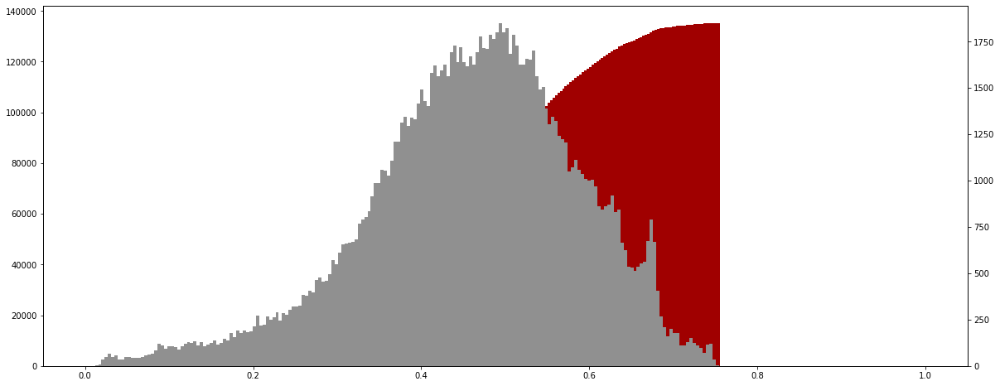

In [0]:
#@markdown **Grayscaled Intensities, binned by Matplotlib hist()**

f, ax1 = plt.subplots(figsize=(20,8))
ax2 = ax1.twinx()
#_ = ax1.set_title("Grayscaled Intensities, binned by Matplotlib hist()")

intensities_cdf_by_mpl, bin_edges, _ = ax1.hist(grayed_image.ravel(), bins=256, cumulative=True, color=dark_red)
intensities_dist_by_mpl, _, _ = ax2.hist(grayed_image.ravel(),256,[0,1], histtype='bar', color=mid_gray)


First the two distribution plots, side by side:

[Why did I say hit and miss?]

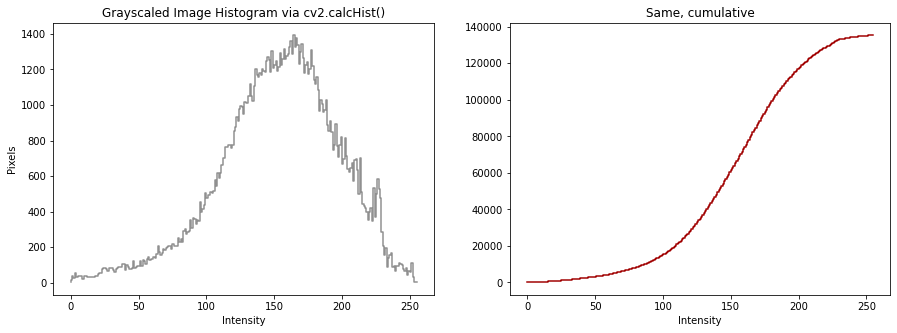

In [0]:
#@title step() is hit and miss
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
_ = ax1.step(eight_bit_range, intensities_histed, color=mid_gray)
ax1.set_title("Grayscaled Image Histogram via cv2.calcHist()")
ax1.set_xlabel("Intensity")
ax1.set_ylabel("Pixels")

# TODO: only 156 bins: _ = ax2.plot(intensities_cdf, color=dark_red)
_ = ax2.step(eight_bit_range, intensities_cumulative, color=dark_red)

_ = ax2.set_title("Same, cumulative")
_ = ax2.set_xlabel("Intensity")
#_ = ax2.set_xlim(0,256)

In [0]:
# TODO: why is this 156 and not 256?
print(len(intensities_cdf))

156


Finally, the two overlaid via `twinx()`.

Also juxtapose the red line above here and below. The jags are ugly but at higher resolution they provide feedback to viewer as to evenness of distribution (smooth is good).

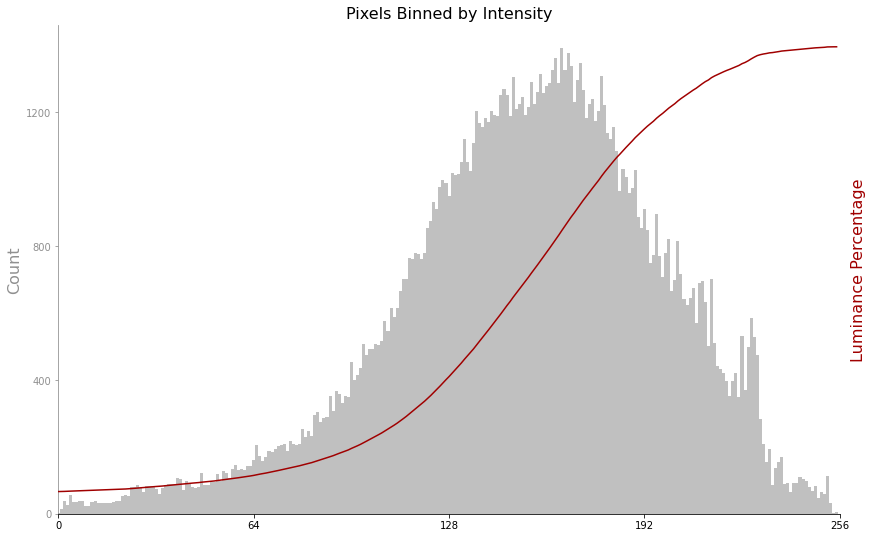

In [0]:
#@title Matplotlib dual gauge
fig, ax1 = plt.subplots(figsize=(14,9)) #, constrained_layout=True)

# specify we want a second glyph to share the same x-axis
ax2 = ax1.twinx() # This is the code to get two subplots sharing the same X axis

plt.subplots_adjust(wspace=0.01, hspace=0.01)

# Turn off border box
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_color(mid_gray)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['left'].set_color(mid_gray)

# Histogram as bars

_ = ax1.bar(eight_bit_range, intensities, width=1.0, color='#c0c0c0')#, ec='r')#, 'b')

#_ = ax1.step(eight_bit_range, intensities, mid_gray)

#_ = ax1.plot(intensities)
#color = 'tab:blue'
ax1.set_title('Pixels Binned by Intensity', fontsize=16)
#ax1.set_xlabel('Intensity', fontsize=16)
ax1.set_ylabel('Count', color=mid_gray, fontsize=16)
ax1.yaxis.label.set_color(mid_gray)
ax1.yaxis.set_major_locator(plt.MaxNLocator(4))
ax1.tick_params(axis='y', color=mid_gray, labelcolor=mid_gray) #color='#0b559f')
#ax1.set_xticks([0, 128, 200, 256], ['0', '128', '200', '256'])
#ax1.set_xticklabels(['100', '200', '300', '400'])
#ax1.xaxis.set_major_locator(plt.MaxNLocator(4))
ax1.xaxis.set_major_locator(plt.MultipleLocator(64))
ax1.tick_params(axis='x', bottom=True)
ax1.set_xlim(0, 256)

# cumulative histogram as line
#color = 'tab:red'
ax2.set_ylabel('Luminance Percentage', fontsize=16, color=dark_red)
#ax2.set_ylabel('cumulative', color=dark_red)
ax2.plot(eight_bit_range, intensities_cumulative, dark_red)
#_ = ax2.plot(intensities_cumulative, color='r')
ax2.tick_params(axis='y', right=False, color=dark_red)
_ = ax2.set_yticklabels([])

## Four duals in a line

This code was found in the skimage documentation, [scikit-image: Histogram Equalization](https://scikit-image.org/docs/0.9.x/auto_examples/plot_equalize.html), and then tweaked a bit to make it work here. There they are comparing an input image and 3 output images derived from the input via various histogram equalization techniques. Here, it's simply a demo for a nice linear 4-up of small distribution plots, with dual histograms.

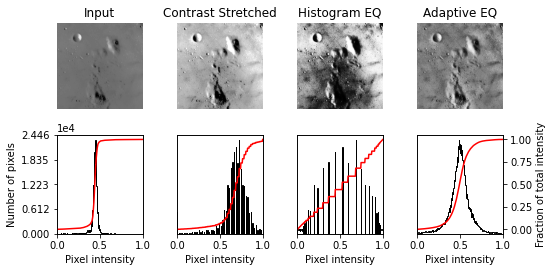

In [0]:
#@title Juxtapose four-up 
import matplotlib.pyplot as plt
import numpy as np

from skimage import data, img_as_float
from skimage import exposure


def plot_img_and_hist(img, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    img = img_as_float(img)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(img, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(img.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(img, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf


# Load an example image
img = data.moon()

# Contrast stretching
p2 = np.percentile(img, 2)
p98 = np.percentile(img, 98)
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))

# Equalization
img_eq = exposure.equalize_hist(img)

# Adaptive Equalization (JFT: CLAHE!)
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)

# Display results
f, axes = plt.subplots(2, 4, figsize=(8, 4))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
ax_img.set_title('Input')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale, axes[:, 1])
ax_img.set_title('Contrast Stretched')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq, axes[:, 2])
ax_img.set_title('Histogram EQ')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 3])
ax_img.set_title('Adaptive EQ')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
plt.subplots_adjust(wspace=0.4)
plt.show()

## Big boys

### Not bad

This is kinda nice but was superceded by a visually less noisy version (less spines, less ticks).

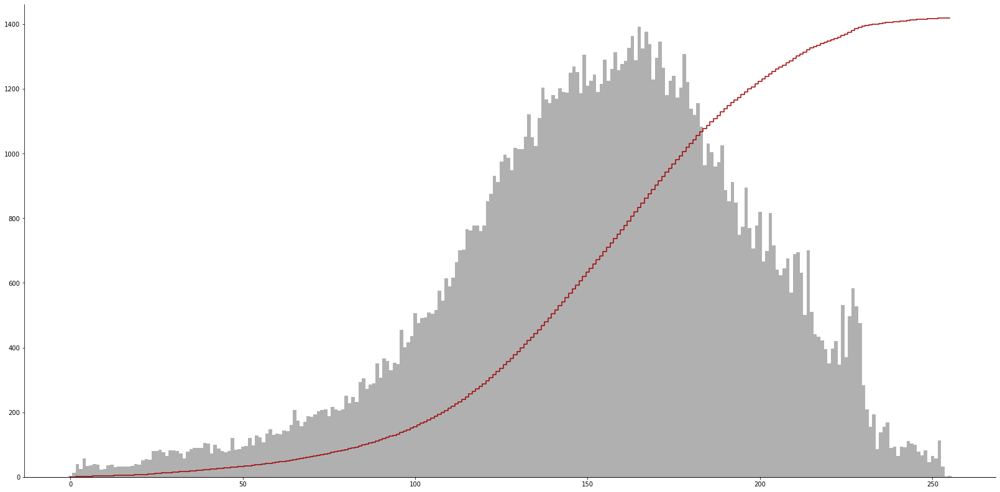

In [0]:
#@markdown **Grayscaled Intensities**

#@markdown Binned by skimage.exposure, plotted by matplotlib

#%%time

f, ax1 = plt.subplots(figsize=(28,14))
ax2 = ax1.twinx()
#_ = ax1.set_title("")

# Turn off border except bottom
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
#ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_visible(True)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(True)
#ax1.spines['bottom'].set_linewidth(2)
ax2.spines['left'].set_visible(False)

ax2.yaxis.label.set_visible(False)
ax2.yaxis.set_ticklabels([])
ax2.yaxis.set_ticks([])


bins_cnt = 256 
intensities_dist_by_skimage, bins_out = skimage.exposure.histogram(grayed_image, bins_cnt)
#print(len(intensities_dist_by_skimage))
#print(bins_out)

# Works, but smooth line not steps: _ = ax1.plot(eight_bit_range, intensities_dist_by_skimage, 'b')
_ = ax1.bar(eight_bit_range, intensities_dist_by_skimage, width=1.0, color=light_gray)#, ec='r')#, 'b')

intensities_cdf_by_skimage, bins_out = skimage.exposure.cumulative_distribution(grayed_image, bins_cnt)

# How to get red line to touch bottom spine
_ = ax2.set_ylim(0,np.max(intensities_cdf_by_skimage) * 1.03)

_ = ax2.step(eight_bit_range, intensities_cdf_by_skimage, dark_red, where='mid')

### Same, refined

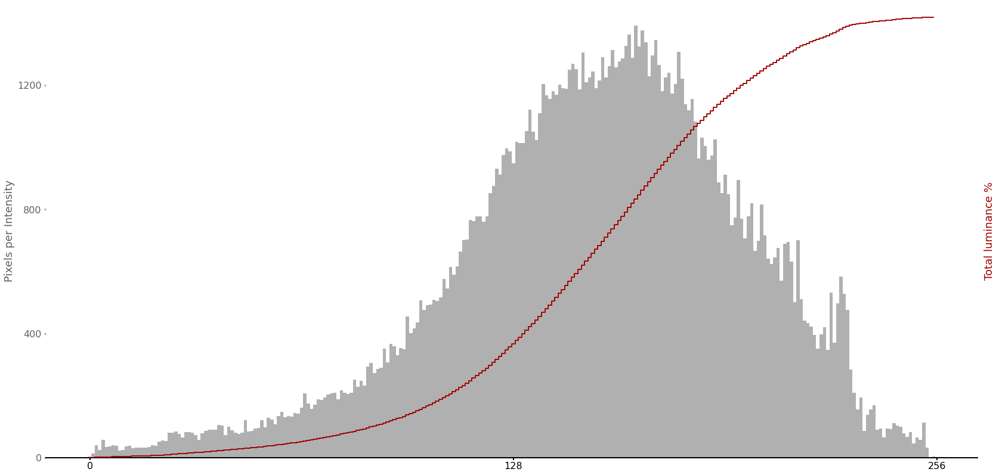

In [0]:
#@markdown **Grayscale Intensities**

#@markdown Binned by `skimage.exposure`, plotted by `matplotlib`

#%%time

intensities_dist, bins_out = skimage.exposure.histogram(grayed_image, 256)
intensities_cdf, bins = skimage.exposure.cumulative_distribution(grayed_image, 256)

fig, ax1 = plt.subplots(figsize=(28, 14)) #, constrained_layout=True)
plt.subplots_adjust(wspace=0.01, hspace=0.01)

# specify we want a second glyph to share the same x-axis
ax2 = ax1.twinx() # This is the code to get two subplots sharing the same X axis

# Turn off border except bottom
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_visible(False)
#ax1.spines['left'].set_color(hist_color)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.spines['left'].set_visible(False)
#ax2.spines['left'].set_color(hist_color)

# Histogram as bars
_ = ax1.bar(eight_bit_range, intensities_dist, width=1.0, color=light_gray)
# line plot works: _ = ax1.plot(intensities, color=hist_color)
#ax1.set_title('Pixels by Intensity', fontsize=20, fontdict={'fontweight': 'bold'})
#ax1.xaxis.set_major_locator(plt.MultipleLocator(128))
ax1.set_xticks([0, 128, 256])
ax1.tick_params(axis='x', bottom=True, width=2, color='k', labelsize=16)
ax1.set_ylabel('Pixels per Intensity', color=light_gray, fontsize=18)
ax1.yaxis.label.set_color('#606060') #hist_color)
ax1.tick_params(axis='y', color=light_gray, width=3, labelcolor='#606060', labelsize=16) #color='#0b559f')
ax1.yaxis.set_major_locator(plt.MaxNLocator(4))

# Cummulative histogram as line
_ = ax2.step(eight_bit_range, intensities_cdf, color=dark_red, where='mid')
ax2.set_ylim(0,np.max(intensities_cdf) * 1.03)
ax2.tick_params(axis='y', right=False, color=dark_red)
ax2.set_yticklabels([])
_ = ax2.set_ylabel('Total luminance %', fontsize=18, color=dark_red)
# line plot works: _ = ax1.plot(intensities, color=hist_color)
#ax1.set_title('Pixels by Intensity', fontsize=20, fontdict={'fontweight': 'bold'})
#ax1.xaxis.set_major_locator(plt.MultipleLocator(128))
ax1.set_xticks([0, 128, 256])
ax1.tick_params(axis='x', bottom=True, width=2, color='k', labelsize=16)
ax1.set_ylabel('Pixels per Intensity', color=light_gray, fontsize=18)
ax1.yaxis.label.set_color('#606060') #hist_color)
ax1.tick_params(axis='y', color=light_gray, width=3, labelcolor='#606060', labelsize=16) #color='#0b559f')
ax1.yaxis.set_major_locator(plt.MaxNLocator(4))

# Cummulative histogram as line
_ = ax2.step(eight_bit_range, intensities_cdf, color=dark_red, where='mid')
ax2.set_ylim(0,np.max(intensities_cdf) * 1.03)
ax2.tick_params(axis='y', right=False, color=dark_red)
ax2.set_yticklabels([])
_ = ax2.set_ylabel('Total luminance %', fontsize=18, color=dark_red)

# Bokeh

**Important:** the following two lines need to be added to make Bokeh example notebooks work on Colab [[*](https://stackoverflow.com/a/48305712/4669056)]:
```python
from bokeh.io import output_notebook
output_notebook()
```
Without the above two lines, Bokeh will run silently without any error messages but very no UI gets to the screen.

In [0]:
from bokeh.io import output_notebook
output_notebook()

**Prior art**

- [ ] [Charts in Colaboratory](https://colab.research.google.com/notebooks/charts.ipynb#scrollTo=N-u5cYwpS-y0)
- [Visualizing Data with Bokeh and Pandas](https://programminghistorian.org/en/lessons/visualizing-with-bokeh): WWII bombing tonage time series
- [Interactive Histograms with Bokeh](https://towardsdatascience.com/interactive-histograms-with-bokeh-202b522265f3)


## Basics

#### `quad()`: don't

Bokeh's `quad()` can be hacked to make a histogram - each bar is a quadralateral. But the following `quad()` based renderings can unfortuneately have horizontal gaps i.e. pixel-wide vertical white line artifacts.

**It is not recommended to use `quad()`.** Oddly the docs do demo using quad(), but `vbar()` seems better. The following technique actually comes from the Bokeh docs gallery, [histogram.html](https://docs.bokeh.org/en/latest/docs/gallery/histogram.html)



In [0]:
#@markdown **Bad quad()-based code**
from bokeh.models import ColumnDataSource, Step
from bokeh.models import LinearAxis, Range1d
import bokeh.palettes


mu, sigma = 128, 40.0 # 0.5

measurements_to_simulate = 2000
measured = np.random.normal(mu, sigma, measurements_to_simulate)
hist, edges = np.histogram(measured, density=True, bins=256)

#print(hist.max(axis=0))

# y_height = hist.max()
#y_height = hist.max()
y_height = 32

# Note need x_range and y_range here to define x and y limits for 1st sub-plots axises
p_jft = bokeh.plotting.figure(title='Hacked up quad() code', background_fill_color="#e2e2ea", x_range=(0,255), y_range=(0,y_height))

# Navy blue solid block of bars (hopefully)
hist, edges = np.histogram(measured, density=False, bins=256)

grey_palette = bokeh.palettes.Greys256 
#print(len(grey_palette))

p_jft.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           #fill_color='navy', line_color='navy', 
           color='#202020', alpha=1.0)

# [0, 1, ..., 255]
eight_bit_range = [*range(0, 256, 1)]

# Red line for cumulative total:
# How to get "twin axes": two plots sharing x, having different y ranges
#   https://docs.bokeh.org/en/latest/docs/user_guide/plotting.html#twin-axes
#p_jft.extra_y_ranges = {"foo": Range1d(start=0, end=measurements_to_simulate*1.05)}
#p_jft.step(eight_bit_range, pixels_hist_df['cumm_count'], line_width=1, line_color='darkred', mode="center", y_range_name='foo')

bokeh.plotting.show(p_jft)

So, `quad()` can do the job of drawing one rectagle per bar but that's kinda a hack.



#### `vbar()`: do

Bokeh's `vbar()` has the semantics of a histogram (just set `bottom` of all bars to 0), making for code that doesn't seem hacky and does not seem to suffer from plotting artifacts. The following left plot is straight out of the Bokeh docs. For the right, just change `width=1.0` to get a solid block of red.

In [0]:
#@markdown **Tuning vbar() for histogram**
#from bokeh.layouts import row

from bokeh.layouts import row

s1 = bokeh.plotting.figure(plot_width=400, plot_height=400, title='width=0.5')
s1.vbar(x=[1, 2, 3], width=0.5, bottom=0,
        top=[1.2, 2.5, 3.7], color="firebrick")

s2 = bokeh.plotting.figure(plot_width=400, plot_height=400, title='width=1.0')
s2.vbar(x=[1, 2, 3], width=1.0, bottom=0,
        top=[1.2, 2.5, 3.7], color="firebrick")

bokeh.plotting.show(row(s1, s2))

For a low number of bars, a solid block certainly does not look like an improvement but the goal here is to have 256 bars.

In [0]:
p = bokeh.plotting.figure(plot_width=1350, plot_height=400)
p.vbar(x=eight_bit_range, width=1.0, bottom=0,
       top=hist, color="navy")
bokeh.plotting.show(p)

## Big boy, binned by NumPy

**TODO:** This is good. Keep going. Just liked the MLP highly styled one. But Bokeh will probably prove to be more useful in terms of interactivity, which has not happened yet.

Note: this Bokeh plot resizes well in full screen mode:
- focus on Bokeh plot below
- look for vertical elipsis button in upper right corner
- select `View output fullscreen`

In [0]:
#@markdown **Grayscaled Intensities**

#@markdown Binned by numpy, plotted by bokeh
#%%time

# https://docs.bokeh.org/en/latest/docs/user_guide/plotting.html#bars

# TODO: why rerun this?
intensities_dist_by_np, _ = np.histogram(grayed_image.ravel(), bins=256, density=False)
intensities_cdf_by_np = intensities_dist_by_np.cumsum()

max_bar_value = np.max(intensities_dist_by_np) # pixels_hist_df.max(axis=0)['count'] 
p = bokeh.plotting.figure(plot_width=1200, plot_height=650, 
                          #title='Pixels by Intensity [by Bokeh]', 
                          background_fill_color="#fafafa", 
                          x_range=(0,255), 
                          y_range=(0,max_bar_value*1.2))
p.sizing_mode = 'scale_both'
p.toolbar.logo = None
p.vbar(x=eight_bit_range, width=0.90, bottom=0,
       top=intensities_dist_by_np, color=light_gray)

# How to get "twin axes": two plots sharing x, having different y ranges
#   https://docs.bokeh.org/en/latest/docs/user_guide/plotting.html#twin-axes
total_pixels = intensities_cdf_by_np[-1]
p.extra_y_ranges = {"foo": Range1d(start=0, end=total_pixels*1.05)}
p.step(eight_bit_range, intensities_cdf_by_np, line_width=1, line_color='darkred', mode="center", y_range_name='foo')

bokeh.plotting.show(p)

**TODO:** 
- cumulative needs a to be defined for uses: legend or axis w/ label
- better x ticks (powers of 2)

### Small but not extra small

**TODO:**
The below four-duals-in-a-line is extra small. Small is the one currently being used in whiteboarder.ipynp. It ensures that all 256 bins get plotted separately into a bar exactly one pixel wide. 

That's a bokeh impl. Maybe a MPL one? **A** plot with all text and one subplot that is exactly 256 pixels wide and has no chrome at all? Basically, how to tell MPL "I want each bin to get one pixel bars."

In [0]:
#@markdown 200x124 small histogram by Bokeh w/ zoom
#from bokeh.models.tools import BoxZoomTool
#bzt = BoxZoomTool()

from bokeh.events import DoubleTap
from bokeh.models.callbacks import CustomJS

def gauge_small_bokeh(binned):
  """Returns a 200x124 pixel histogram. Param binned is the main output of 
     some histogramme; should be an array with len() == 256"""
  p = bokeh.plotting.figure(plot_width=200, plot_height=124, tools='box_zoom')
  p.toolbar.logo = None
  p.toolbar_location = None
  p.xaxis.visible = False
  p.yaxis.visible = False
  p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = None
  p.x_range.range_padding = p.y_range.range_padding = 0
  p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))
  p.vbar(x=eight_bit_range, width=1.0, bottom=0,
         top=binned, color='#404040')
  return p

gauge = gauge_small_bokeh(hist)
bokeh.plotting.show(gauge)

## Intensity window masker

This could also be thought of as a band pass filter.


In [0]:
#@markdown Grid layout by Colab, plot by Bokeh, slider by IPyWidgets

import google.colab.output
import cv2
from skimage.util import img_as_ubyte

def gauge_small_bokeh(binned):
    """Returns a 200x124 pixel histogram. Param binned is the main output of 
       some histogramme; should be an array with len() == 256"""
    p = bokeh.plotting.figure(plot_width=256, plot_height=150, tools='box_zoom')
    p.toolbar.logo = None
    p.toolbar_location = None
    p.xaxis.visible = False
    p.yaxis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.x_range.range_padding = p.y_range.range_padding = 0
    # This next sets a double tap on image to reset zoom and pan
    p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))
    p.vbar(x=eight_bit_range, width=1.0, bottom=0,
           top=binned, color='#404040')
    return p


def image_small_bokeh(an_image, a_title):
  """an_image is a skimage gray image"""
  rgb = cv2.cvtColor(img_as_ubyte(an_image),cv2.COLOR_GRAY2RGB)
  rgba = cv2.cvtColor(rgb, cv2.COLOR_RGB2RGBA)
  rgba_flipped = rgba[::-1, :]

  p = bokeh.plotting.figure(plot_width=256, plot_height=160, tools='box_zoom', title=a_title)
  #img_plot.image(image=[grayed_image], x=[0], y=[0], dw=[1080], dh=[720]) #, palette="Spectral11", level="image")
  da_image = p.image_rgba(image=[rgba_flipped], x=[0], y=[0], dw=[1080], dh=[720]) #, palette="Spectral11", level="image"
  p.toolbar.logo = None
  p.toolbar_location = None
  p.xaxis.visible = False
  p.yaxis.visible = False
  p.x_range.range_padding = p.y_range.range_padding = 0
  #p.sizing_mode = 'stretch_both'
  return p

low_pass_mask = None
high_pass_mask = None
band_pass_mask = None

# How to not override users choice every change
low_pass_threshold_in_ui = -1
high_pass_threshold_in_ui = -1
if low_pass_threshold_in_ui == -1:
  # ... it's uninited  
  low_pass_threshold_in_ui = 105
if high_pass_threshold_in_ui == 0:
  # ... it's uninited  
  high_pass_threshold_in_ui = 40

def on_band_slider_event(an_event): #, max, other):
  global high_pass_threshold_in_ui
  global low_pass_threshold_in_ui
  global band_pass_mask
  
  if an_event.type == 'change' and an_event.name == 'value':
    grid.clear_cell(0,2)
    high_pass_threshold_in_ui = an_event['new'][0]
    low_pass_threshold_in_ui = an_event['new'][1]
    perform_band_pass()

band_slider = ipywidgets.IntRangeSlider(
  value=(high_pass_threshold_in_ui, low_pass_threshold_in_ui),
  min=0, max=255, step=1,
  continuous_update=False, # TODO: play with this
  # description='Band:',
  readout=False,
  readout_format='d',
  layout=ipywidgets.Layout(width='256px')#, height='50px')
  )
band_slider.observe(on_band_slider_event)

def perform_band_pass():
  global low_pass_mask
  global high_pass_mask
  global grid

  high_pass_threshold = high_pass_threshold_in_ui/256
  low_pass_threshold = low_pass_threshold_in_ui/256

  low_pass_mask = grayed_image < low_pass_threshold
  high_pass_mask = grayed_image > high_pass_threshold

  band_pass_mask = low_pass_mask & high_pass_mask

  small_image = image_small_bokeh(band_pass_mask, 'Window masked')
  with grid.output_to(0, 2):
    grid.clear_cell(1,0)
    # Band-passed
    #print('b-p row')
    bokeh.plotting.show(small_image)
  
grid = google.colab.widgets.Grid(2, 3, style='border:none') 
# Input image:
with grid.output_to(0, 0):
  small_image = image_small_bokeh(grayed_image, 'Grayscaled input')
  bokeh.plotting.show(small_image)
# Histogram:
with grid.output_to(0,1):
  print('\n')
  gauge = gauge_small_bokeh(intensities_dist_by_np)
  bokeh.plotting.show(gauge)
  display(band_slider)

perform_band_pass()

# TODO: add a spinner?

,,
,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

IntRangeSlider(value=(0, 105), continuous_update=False, layout=Layout(width='256px'), max=255, readout=False)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**TODO:** better layout. Maybe 3x3 Grid(): 
- Top: titles
- Middle: meat
- Bottom just slider

### Lluminosity dual gauge

In [0]:
#@markdown Pixels by Intensity

# TODO: this has a mix of intensities_cumulative and (recalc'ed) np.histogram(grayed_image.ravel())
from bokeh.models import Axis
from bokeh.palettes import Greys256
from bokeh.palettes import Greys9

y_range_max = np.max(intensities) * 1.10

p_jft = bokeh.plotting.figure(background_fill_color='#f8f8fa', # Nice enough: mid-dark-blue:'#b1bec9', '#f8f8fa', 
                              x_range=(0,255), y_range=(0,y_range_max), 
                              plot_width=1350, plot_height=400,
                              min_border_right=14, 
                              toolbar_location='below') # title='Pixels by Intensity') 

p_jft.sizing_mode = 'stretch_both'
p_jft.toolbar.logo = None
p_jft.toolbar.autohide = True

p_jft.ygrid.grid_line_alpha = 0.75
p_jft.xgrid.grid_line_color = None
yaxis = p_jft.select(dict(type=Axis, layout='left'))[0]
yaxis.formatter.use_scientific = False
p_jft.yaxis[0].ticker.desired_num_ticks = 3

from bokeh.models.tickers import FixedTicker
p_jft.xaxis.ticker = FixedTicker(ticks=[0, 128, 255])
p_jft.yaxis.axis_label = 'Pixels per Intensity'

# Main histogram
hist, edges = np.histogram(grayed_image.ravel(), density=False, bins=256)
edges = edges * 255
p_jft.vbar(x=eight_bit_range, width=1.0, bottom=0,
       top=hist, color=bokeh.palettes.Greys256)

# Top skyline of histogram:
p_jft.step(eight_bit_range, hist, line_width=1, 
           line_color='#808080', 
           mode='center') #, y_range_name='foo')

# Red line for cumulative luminosity step curve
total_pixels = intensities_cumulative[-1]

# How to get "twin axes": two plots sharing x, having different y ranges
#   https://docs.bokeh.org/en/latest/docs/user_guide/plotting.html#twin-axes
p_jft.extra_y_ranges = {'foo': Range1d(start=0, end=total_pixels*1.05)}
an_axis = LinearAxis(y_range_name='foo',
                     axis_line_alpha=0,
                     #formatter=None,
                     major_label_text_font_size='0pt',
                     major_tick_line_color=None, 
                     minor_tick_line_color=None, 
                     axis_label='Total luminance %', 
                     axis_label_text_color=dark_red)
p_jft.add_layout(an_axis, 'right')
p_jft.step(eight_bit_range, intensities_cumulative, line_width=1, line_color='darkred', mode='center', y_range_name='foo')

bokeh.plotting.show(p_jft)

In [0]:
#@markdown **TODO:** gray gradient on "skyline," try again

# TODO: abortive attempt to get a gray gradient on "skyline"
#      Gradient on face, OK. On line, in Bokeh no go?
# Color mapper maybe?
# https://docs.bokeh.org/en/latest/docs/user_guide/styling.html#using-mappers

#from bokeh.transform import linear_cmap
#from bokeh.models import ColumnDataSource
#source = ColumnDataSource(dict(x=eight_bit_range,y=hist))
#
#from bokeh.models import LinearColorMapper
#color_mapper = LinearColorMapper(palette=Greys256)
#mapper = linear_cmap(field_name='x', palette=Greys256_darkened ,low=0 ,high=255)
#p_jft.step(x='x', y='y', source=source, line_width=1, 
#           line_color=mapper, #Greys256, # _darkened, 
#           #color=mapper,
#           #line_color={'field': 'x', 'transform': color_mapper}, #'#a0a0a0', 
#           mode='center') #, y_range_name='foo')

import bokeh.colors
from bokeh.palettes import Greys256

def darken(hex_color, factor):
  factor = 1 - factor

  # Parse '#112233 to 11, 22, 33
  r, g, b = int(hex_color[1:3], 16), int(hex_color[3:5], 16), int(hex_color[5:], 16)
  r = int(r * factor)
  g = int(g * factor)
  b = int(b * factor)
  return bokeh.colors.RGB(r, g, b).to_hex()

Greys256_darkened = [darken(x, 0.2) for x in Greys256]

#print(darken('#112233', 0.1))
#print(Greys256)
#print(Greys256_darkened)

# Plotly


## 1D basics

[This is code that was not worked until success (haven't figured out how to get dist and cdf on same plot) but might be returned to later.]

Plotly has `plotly.graph_objects.Histogram`.

**TODO:** 2 dist hist ok. 1 hist and 1 cumul: not yet...

**TODO:** Notice how the skyline is different with Plotly. Need to confirm bins.

Dual is not something that plotly is really recommending nor were implementations to found at hand. **TODO:** there is probably a way to do this; might involve pouring all data into a DataFrame and then expressing hist vs cumm_hist as calls into plotly.

In [0]:
#@markdown **Binned and Plotted by `plotly`**

#%%time

# dropped was just a test to see if two "different' histo could be plotted: yes
dropped = grayed_image * 0.6
#amped = grayed_image[:,1] = grayed_image * 50

fat_grayed = grayed_image.ravel() * 256
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=grayed_image.ravel(), 
                 cumulative_enabled=False,
                 nbinsx=256, autobinx = False,
                 marker_color=light_gray))

plotees = dropped.ravel()
#print(plotees)
#plotees = plotees * 256
#plotees = plotees * 5000
#print(plotees[42])
#fig.add_trace(go.Histogram(x=plotees, cumulative_enabled=False))
fig.update_yaxes(nticks=3)
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)

fig.show()


In [0]:
#@markdown **Binned and Plotted by `plotly`**

pixels = np.array(grayed_image.ravel())
pixels_hist = np.histogram(pixels, bins=256, density=True)
pixels_hist_cumulative = np.cumsum(pixels_hist[0])

#fig = go.Figure(data=go.Scatter(x=pixels_hist[1], y=pixels_hist_cumulative))
fig = go.Figure(data=[go.Histogram(x=grayed_image.ravel()*256, cumulative_enabled=False, nbinsx=256)])

fig.update_layout(
    xaxis = dict(range = (0,256)),
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 4000
    )
)


fig.show()


In [0]:
fig = go.Figure(data=[go.Histogram(x=grayed_image.ravel(), cumulative_enabled=True)])
fig.show()


## 2D basics

Packages with 2D histograms
- [numpy.histogram2d](https://numpy.org/doc/stable/reference/generated/numpy.histogram2d.html)
- [OpenCV](https://www.pyimagesearch.com/2014/01/22/clever-girl-a-guide-to-utilizing-color-histograms-for-computer-vision-and-image-search-engines/)


,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

    Reds vs. Greens


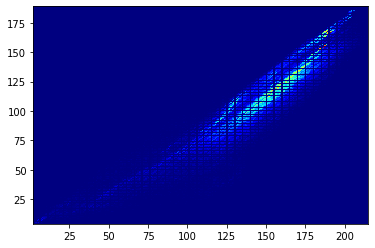

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

    Reds vs. Blues


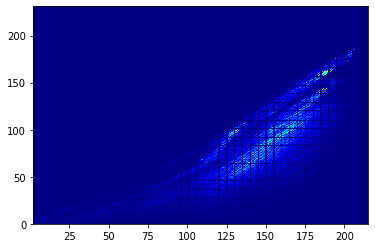

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

    Greens vs. Blues


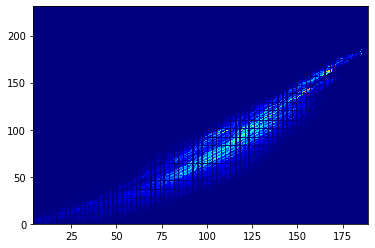

<IPython.core.display.Javascript object>

In [48]:
#@markdown Three matplotlib hist2d() juxtapositions 
# MPL's hist2d via https://python-graph-gallery.com/83-basic-2d-histograms-with-matplotlib/

# TODO: flatten() is copying. Surely there is a more elegant solution.
reds = color_image[:, :, 0].flatten()
greens = color_image[:, :, 1].flatten()
blues = color_image[:, :, 2].flatten()

grid = google.colab.widgets.Grid(1, 3, style='border:none') 
# Input image:
with grid.output_to(0, 0):
  print('    Reds vs. Greens')
  _ = plt.hist2d(reds, greens, bins=(256, 256), cmap=plt.cm.jet)

with grid.output_to(0, 1):
  print('    Reds vs. Blues')
  _ = plt.hist2d(reds, blues, bins=(256, 256), cmap=plt.cm.jet)

with grid.output_to(0, 2):
  print('    Greens vs. Blues')
  _ = plt.hist2d(greens, blues, bins=(256, 256), cmap=plt.cm.jet)

**TODO:** Turbo, not Jet. Why RvG & GvB not going to 256? 

In [0]:
# 2D array of pixels => 1D array of pixels

def pair_plot_two_color_channels(anImage, a_pairing):
  # How to pythonically enum 3 pairings: RB, RG, BG
  pass

  

# Future work

- 3D
- Colorized intensities histogram, [Issue #55](https://github.com/reconstrue/shell/issues/55)

**TODO:** interesting stats. Worth the UI? Collapsible?

<img src="https://i.stack.imgur.com/m4A4r.png" width="50%" />


## Seaborn

[Seaborn turned out to be massively annoying trial-and-error runaround in this situation, cause all manner of plot ugliness b/c it seemingly isn't prepared for a histogram of 256 bars (styling edges white => visual noise). Only looks good around a max of 32 bar.]

For a dual histogram plot, the Matplotlab trick is `twinx()` which makes the X axis be a siamese twin, returning the new second twin to config. The twins axes share their x-axis.


In [0]:
#@markdown Seaborn disable for interfering
# sns.set(style='dark')
# sns.distplot(image.ravel(), bins = 256, kde=False)
#sns.set_style('dark')
#sns.set_style({'patch.edgecolor': 'b'}) # This prevents style error to lots of verticle lines, seaborn overstyling the bars
#plt.rcParams["patch.linewidth"] = 0.001 # suppress plotting error noise

# TODO: isn't this wrong? not relative lum'd?
#NOOOOOO.  ax = plt.hist(image.ravel(), bins = 256, color='lightgray')

# TODO: guessing on seaborn magic BS
#plt.show()



# zip hist and cumm_hist into a DataFrame.
#import pandas as pd

# hist is an array of single element arrays of one float?
# Same for hist.cumsum() but simple array of floats? weird diff.
#hist_dressed_up = np.asarray(intensities_histed.flatten(), dtype='int32')

#hist_cumulative = intensities_histed.cumsum()

#collated = zip(eight_bit_range, hist_dressed_up, hist_cumulative)

# TODO: rename this intensities
#pixels_hist_df = pd.DataFrame(collated, columns=['intensity','count', 'cumm_count'], dtype=np.int32)

#DataTable(pixels_hist_df)



#pixels_hist_df.plot()



#Create combo chart
#fig, ax1 = plt.subplots(figsize=(10,6)) #, constrained_layout=True)
#sns.set_style('white') # this will trigger the bug
#plt.subplots_adjust(wspace=0.01, hspace=0.01)

#plt.rcParams["axes.grid"] = False
#plt.rcParams["patch.linewidth"] = 0.001 # suppress plotting error noise
#sns.set_style('dark', {'patch.edgecolor': 'b', 
#                       'patch.facecolor': 'g', 
#                       'patch.linewidth': 4,
#                       'patch.force_edgecolor': True
#                       }) 
#{"xtick.major.size": 8, "ytick.major.size": 8}

# Turn off border box
#ax1.spines['top'].set_visible(False)
#ax1.spines['right'].set_visible(False)
#ax1.spines['bottom'].set_visible(False)
#ax1.spines['left'].set_visible(True)
#ax1.spines['left'].set_color(mid_gray)

# Histogram as bars
#color = 'tab:blue'
#ax1.set_title('Pixel Sorted by Intensities', fontsize=16)
#ax1 = sns.barplot(x='intensity', y='count', data = pixels_hist_df, color=color, saturation=1) # , palette='summer'  palette='Blues_d', )
#ax1.set_xlabel('Intensity', fontsize=16)
#ax1.set_ylabel('Count', color=mid_gray, fontsize=16)
#ax1.yaxis.label.set_color(mid_gray)
#ax1.tick_params(axis='y', color=mid_gray, labelcolor=mid_gray) #color='#0b559f')

# specify we want to share the same x-axis
#ax2 = ax1.twinx() # This is the code to get two subplots sharing the same X axis
#sns.despine(ax=ax2, bottom=True)

# cumulative histogram as line
#color = 'tab:red'
#ax2.set_ylabel('cumulative total pixels', fontsize=16)
#ax2 = sns.lineplot(x='intensity', y='cumm_count', data=pixels_hist_df, sort=False, color=color) #, rc={})
#ax2.tick_params(axis='y', right=False, color=dark_red)
##ax2.set_xticklabels([])
##ax2.set_yticklabels([])
#ax2.set_ylabel('cumulative', color=mid_gray)#dark_red)
#pass

And with that, it's good enough. Time to move beyond Matplotlib and Seaborn to a more interactive UI library so that we can start putting zoom and handles and such into the mix.

## OpenCV

- https://docs.opencv.org/master/d1/db7/tutorial_py_histogram_begins.html
  - https://github.com/opencv/opencv/blob/master/samples/python/hist.py#L47
- https://docs.opencv.org/2.4/modules/imgproc/doc/histograms.html

## Library view

**TODO:** the following image comes from a paper, [Fast Ordering Algorithm for Exact Histogram Specification](https://www.researchgate.net/publication/267729759_Fast_Ordering_Algorithm_for_Exact_Histogram_Specification). There might well a reason to implement something similar, but not yet.

<img src="https://www.researchgate.net/profile/Mila_Nikolova/publication/267729759/figure/fig1/AS:616353358684160@1523961500030/All-24-digital-8-bit-images-with-their-histograms-used-for-our-comparison-The-size-of.png" />

